<a href="https://colab.research.google.com/github/carolinesmith527/datascience/blob/main/dog-vision/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Dog Breed Classification

This notebook builds an end-to-end multi-class image classification model using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

Identifying the breed of a dog given the image of a dog.

When I'm sitting at a cafe and take an image of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image: https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10000+ images in the training set (these images have labels)
* There are around 10000+ images in the test set (these images don't have labels, because we'll want to predict them)

### Download Data From Kaggle

In [ ]:
# !pip install kaggle

In [ ]:
from google.colab import files

# files.upload()

In [ ]:
# ! mkdir ~/.kaggle

# ! cp kaggle.json ~/.kaggle/

In [ ]:
# ! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# ! kaggle datasets list

ref                                                    title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
rahulvyasm/netflix-movies-and-tv-shows                 Netflix Movies and TV Shows                           1MB  2024-04-10 09:48:38           3131         65  1.0              
sudarshan24byte/online-food-dataset                    Online Food Dataset                                   3KB  2024-03-02 18:50:30          29939        576  0.9411765        
nayanack/netflix                                       Netflix Chronicles: Exploring Movies and TV Shows     1MB  2024-04-16 07:36:08           1061         23  0.88235295       
sunnykakar/spotify-charts-all-audio-data               Spotify Charts (All Audio Data)                   

In [ ]:
# ! kaggle competitions download -c dog-breed-identification

 99% 682M/691M [00:07<00:00, 111MB/s]
100% 691M/691M [00:07<00:00, 90.8MB/s]


### Load Data

In [1]:
# Mount google colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ! cd drive/MyDrive/

In [ ]:
# ! mkdir DogVision

In [ ]:
# ! cp /content/dog-breed-identification.zip /content/drive/MyDrive/"Dog Vision"

In [2]:
cd /content/drive/MyDrive/"Dog Vision"

/content/drive/MyDrive/Dog Vision


In [9]:
# ! unzip /content/drive/MyDrive/"Dog Vision"/dog-breed-identification.zip -d dog-breed-identification

Streaming output truncated to the last 5000 lines.
  inflating: dog-breed-identification/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: dog-breed-identification/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: dog-breed-identification/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: dog-breed-identification/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: dog-breed-identification/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: dog-breed-identification/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: dog-breed-identification/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: dog-breed-identification/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: dog-breed-identification/train/83fad0718581a696132c96c166472627.jpg  
  inflating: dog-breed-identification/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: dog-breed-identification/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: dog-breed-identificatio

### Get our workspace ready

* Import TensorFlow 2.0 ✅
* Import TensorFlow Hub
* Make sure we're using GPU

In [28]:
# Import necessary tools (tensorflow) into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: ",tf.__version__)
print("TF Hub Version: ",hub.__version__)
print("GPU","Yesssss available!!!!" if tf.config.list_physical_devices("GPU") else "Not available :(")

TF Version:  2.15.0
TF Hub Version:  0.16.1
GPU Yesssss available!!!!


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first, turning our data into tensors (numerical representations)

Let's start by accessing our data and checking out the labels.

In [4]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

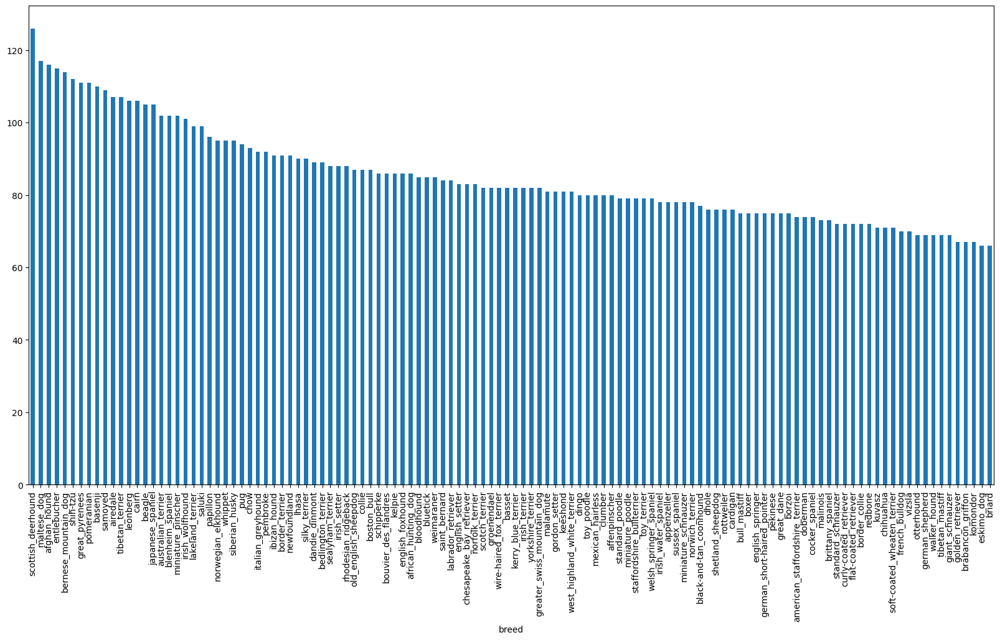

In [5]:
# How many photos are there of each breed
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv.breed.value_counts().median()

82.0

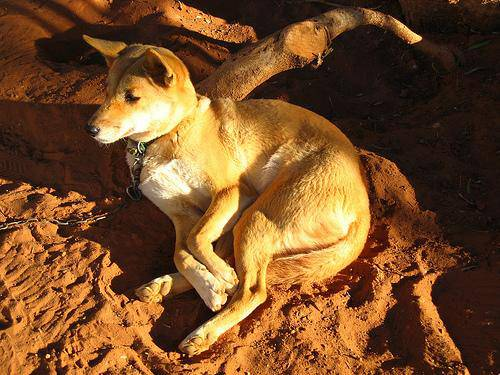

In [7]:
# Let's view an image
from IPython.display import Image

Image("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [8]:
# create pathnames from image id
filenames = ["/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/"+fname+".jpg" for fname in labels_csv.id]

# check first ten
filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-

In [9]:
# unzip the train folder
# ! unzip /content/drive/MyDrive/"Dog Vision"/dog-breed-identification.zip -d dog-breed-identification

In [10]:
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("same number of images as filenames")
else:
  print("number of images don't match filenames",len(os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/")),len(filenames))

same number of images as filenames


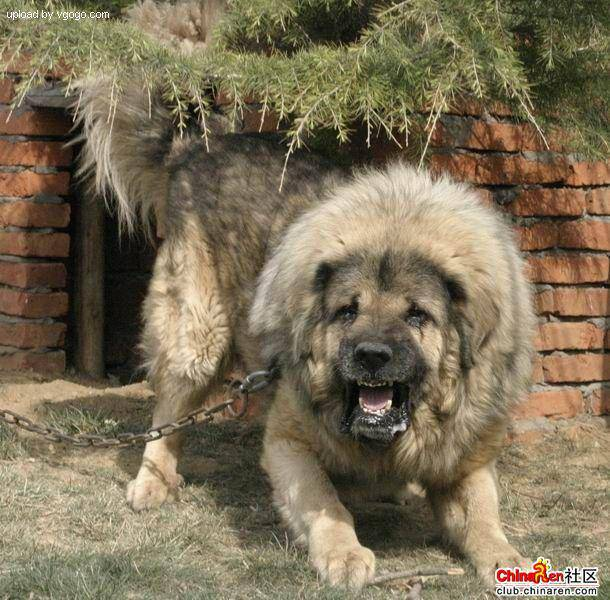

In [11]:
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we now have all our training image filepaths in a list, let's prepare our labels.

In [13]:
import numpy as np
labels = np.array(labels_csv["breed"])
print(labels[:5])
len(labels)

['boston_bull' 'dingo' 'pekinese' 'bluetick' 'golden_retriever']


10222

In [14]:
# see if number of filenames match labels
if len(labels)==len(filenames):
  print("labels matches number of filenames")
else:
  print("labels does not match number of filenames")

labels matches number of filenames


In [15]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [16]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the data doesn't come with a validation set, we our going to create our own.

In [18]:
# set up X and y variables
X = filenames
y = boolean_labels

In [19]:
len(filenames)

10222

We're going to start experimenting with 1000 images and increase as needed.

In [21]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 # @param : {type: "slider", min: 1000, max: 10000, step:1000}

In [22]:
# lets split our data into train and validation
from sklearn.model_selection import train_test_split

# split them into total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [23]:
X_train[:5],y_train[:5]

(['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fa

## Preprocessing images (turning images into tensors)

To preprocess our images, we are going to write some functions. This function will:
1. Take an image filepath as input
2. Use tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into tensors
4. Resize the `image` to size (224,224)
5. Return the modified `image`

Before we do, let's see what importing an image function looks like.

In [22]:
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [23]:
image.max(),image.min()

(255, 0)

In [24]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [25]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

### Now we've seen what an image looks like as a Tensor. Let's make a function to preprocess them.

1. Take an image filepath as input
2. Use tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize tensor color channel values from 0-255 to 0-1
5. Resize the `image` to size (224,224)
6. Return the modified `image`

In [24]:
# define image size
IMG_SIZE=224

# create a funciton for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpg into numerical tensor with 3 color channels Red, Green, and Blue
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color values from 0 to 255 to 0 to 1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to (224,224)
  image = tf.image.resize(image, [IMG_SIZE,IMG_SIZE])

  return image

## Turn our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they may not all fit into memory.  Thats why we do about 32 images (this is the batch size) at a time (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need to pass our data as Tensor tuples like this:
`(image, label)`

In [25]:
# create a simple function to return a tuple (image, label)
def get_image_label(image_path,label):
  """
  Takes an image file path and associated label, preprocesses the image, and returns a Tensor tuple of (image,label).
  """
  image=process_image(image_path)
  return image,label


Now we've got a way to turn our data into tuples of form `(image, label)` now we need a function to turn all of our data `X` and `y` into batches

In [26]:
# Define the batch size, 32 is good start
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (with no labels).
  """
  # if the data is test dataset, it doesnt have labels
  if test_data:
    print("Printing test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filenames no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    # shuffling pathnames and labels before mapping image processing function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch


In [29]:
# create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)


Creating training data batches...
Creating validation data batches...


In [30]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [31]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

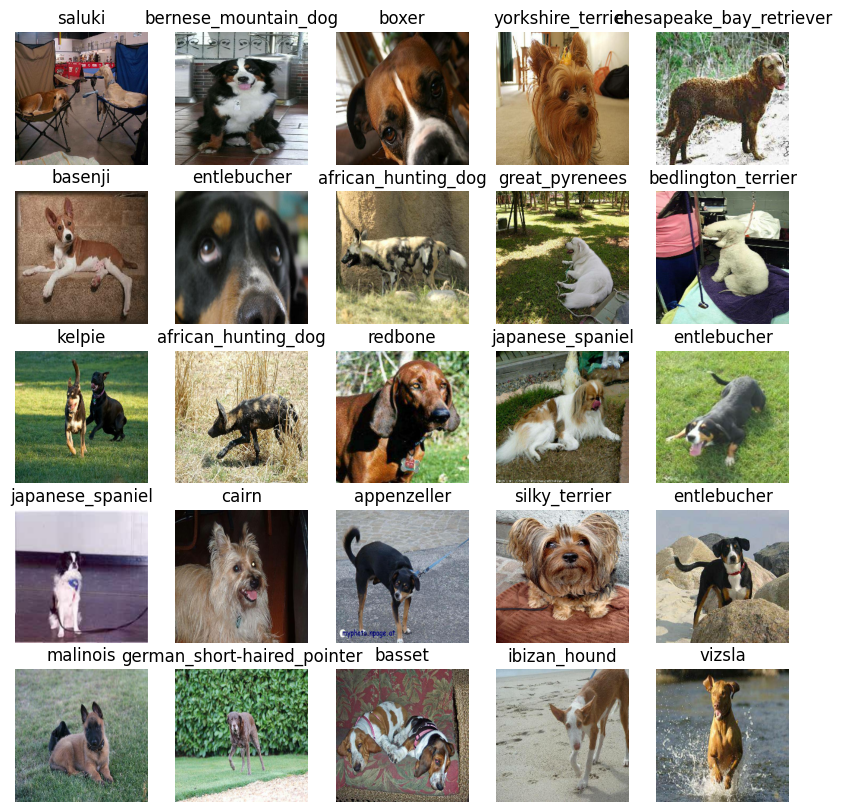

In [32]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

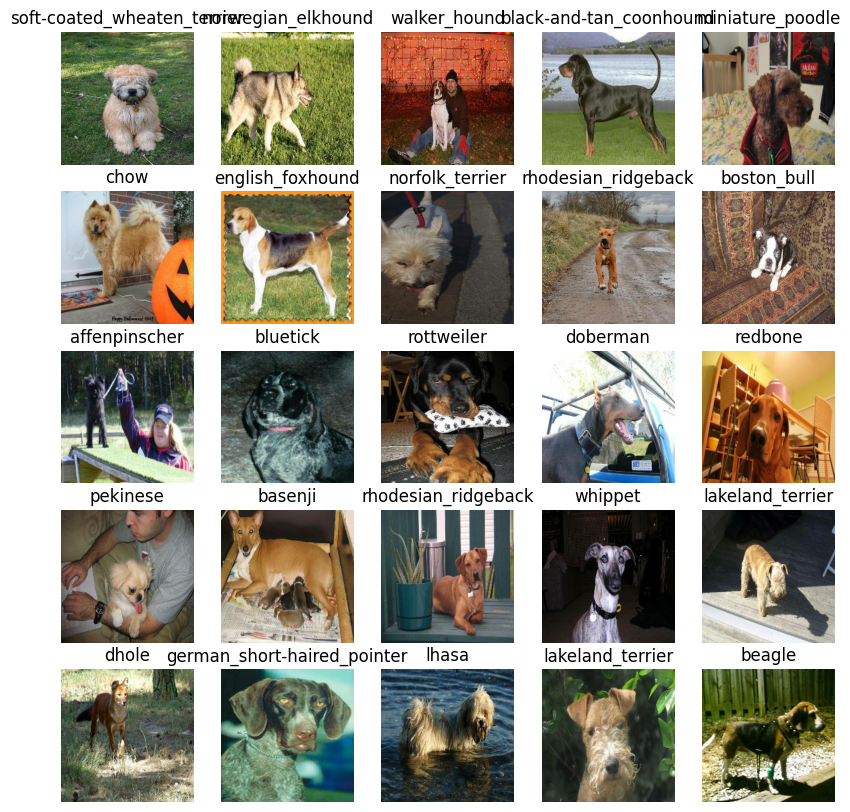

In [33]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of tensors)
* The output shape (labels, in the form of tensors)
* The model url

In [31]:
# set up input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colors

# set up output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# set up model url from tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready.  Let's put them together in a Keras deep learning model.

We will create a function which will:

* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.


In [32]:
# create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # set up the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1: Input Layer
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2: Output Layer
                               ])
  # compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # build model
  model.build(INPUT_SHAPE)

  return model

In [33]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during its training to do things like: save its progress, check its progress, or stop training early if a model stops improving.

We'll create two callbacks. One for Tensorboard which helps track our models progress and one for early stopping which prevents our model from training for too long.

### TensorBoard Callback
To load we need to do a few things:
1. Load TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [34]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [35]:
import datetime

# create a function to build a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  )
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps prevent from overfitting by stopping training if a certain evaluation method stops improving

In [36]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on a subset of 1000 images, to make sure everything is working.

In [37]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

Let's create a function which trains the model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for, and callbacks we'd like to use
* Return the model

In [38]:
# Build a function to train and return trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model=create_model()
  # create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # fit the model to the data passing our callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping]
            )
  # return the fitted model
  return model

In [39]:
# fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 99s 4s/step - loss: 4.6684 - accuracy: 0.0900 - val_loss: 3.4155 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 142ms/step - loss: 1.6844 - accuracy: 0.6875 - val_loss: 2.1483 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 4s 167ms/step - loss: 0.5871 - accuracy: 0.9262 - val_loss: 1.6818 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 5s 184ms/step - loss: 0.2640 - accuracy: 0.9850 - val_loss: 1.5217 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 144ms/step - loss: 0.1511 - accuracy: 0.9950 - val_loss: 1.4463 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 4s 166ms/step - loss: 0.1037 - accuracy: 0.9987 - val_loss: 1.4026 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

In [40]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [41]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [67]:
# make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 118ms/step


array([[1.3913441e-03, 5.8333819e-05, 3.7605499e-03, ..., 2.6527257e-04,
        1.0769679e-05, 2.0461353e-03],
       [1.1853068e-03, 1.9437609e-04, 1.4141150e-02, ..., 4.5848852e-03,
        3.6793509e-03, 2.3864828e-04],
       [9.4581337e-05, 4.9994345e-05, 5.0445546e-05, ..., 6.1513208e-05,
        5.7330057e-05, 9.5158210e-04],
       ...,
       [1.3035831e-06, 1.0131505e-05, 5.1479883e-06, ..., 1.7166207e-06,
        4.5893958e-06, 8.9276327e-05],
       [4.3895510e-03, 1.4800642e-04, 1.3517932e-04, ..., 3.2453096e-05,
        4.6860896e-05, 2.1594479e-03],
       [2.4323579e-04, 2.4244398e-05, 3.6476098e-04, ..., 5.1713763e-03,
        6.2883412e-04, 1.9318465e-04]], dtype=float32)

In [68]:
predictions.shape

(200, 120)

In [69]:
len(y_val)

200

In [45]:
np.sum(predictions[0])

1.0000001

In [70]:
# first prediction
index=42
print(predictions[index])
print(f"Max Value (Probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[3.30963267e-05 2.31405520e-05 5.49787001e-05 3.04510577e-05
 5.11566526e-04 5.82957437e-05 4.91905317e-04 1.48682995e-03
 9.98466183e-03 7.32828863e-03 1.66707250e-05 7.06156288e-06
 4.95971472e-04 5.61367068e-03 1.27979764e-03 2.37082550e-03
 5.74393380e-06 4.03851736e-04 1.12900998e-04 3.20355641e-04
 2.87795365e-06 7.17105635e-04 1.69676841e-05 3.38503414e-05
 6.95147039e-03 8.74391189e-05 1.47983465e-05 7.58890601e-05
 1.16696661e-04 7.32478729e-05 1.44411242e-04 1.45598906e-05
 3.20689760e-05 6.71548651e-06 6.24537570e-05 1.69364812e-05
 4.04681778e-05 4.76686691e-04 4.61814343e-05 2.99411625e-01
 3.53261712e-05 2.35967327e-05 9.47097724e-04 5.89933461e-06
 9.30219176e-05 5.23055278e-05 9.51637703e-05 4.68660786e-04
 5.22858500e-06 1.82763673e-04 1.43102861e-05 1.22305055e-05
 3.19544459e-04 6.28905778e-04 8.06368826e-06 3.33809498e-04
 3.90671703e-05 4.77623616e-05 9.84266171e-06 1.04626724e-05
 6.96671414e-05 2.74862192e-04 4.22968469e-06 3.69925328e-05
 8.23060473e-05 5.887742

Now we want to turn our predictions into their respective labels.

In [71]:
# make a function to turn predictions into labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [72]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation dataset is still in a batch format, we need to unbatch it.

In [96]:
# create a function to unbatch data
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []

  # loop through unbatched data
  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# unbatchify the training data
val_images, val_labels = unbatchify(val_data)

In [74]:
images_ = []
labels_ = []

# loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

Now we've got ways to get:
* prediction labels
* validation labels (truth labels)
* validation images

Lets make a function to make this all more visual.

We'll create a function which:

1. Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
2. Convert the prediction probabilities to a predicted label. ✅
3. Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅


In [90]:
import matplotlib.pyplot as plt

def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob = prediction_probabilities[n]
  true_label = labels[n]
  image = images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  print(pred_label,n,type(labels[n]))
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

In [97]:
val_labels[77]

'groenendael'

groenendael 77 <class 'str'>


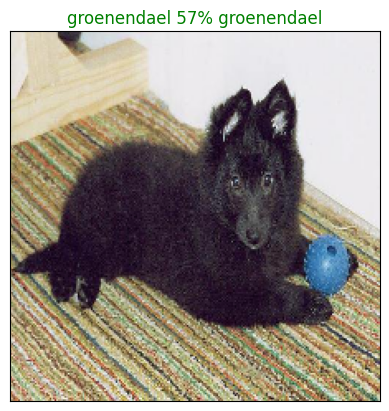

In [98]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [166]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

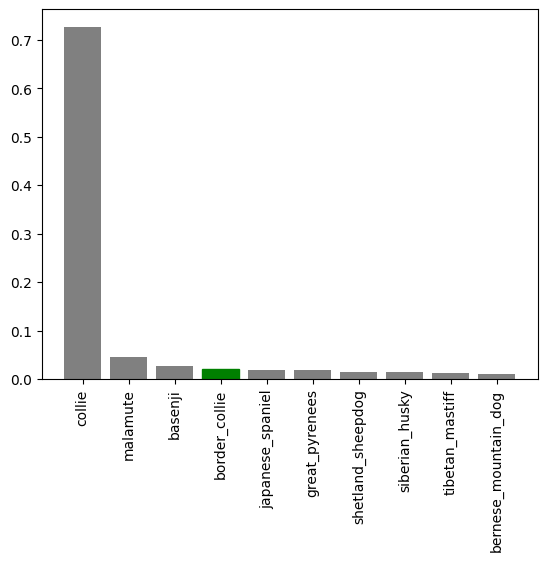

In [175]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)


flat-coated_retriever 20 <class 'str'>
samoyed 21 <class 'str'>
cairn 22 <class 'str'>
blenheim_spaniel 23 <class 'str'>
welsh_springer_spaniel 24 <class 'str'>
scottish_deerhound 25 <class 'str'>


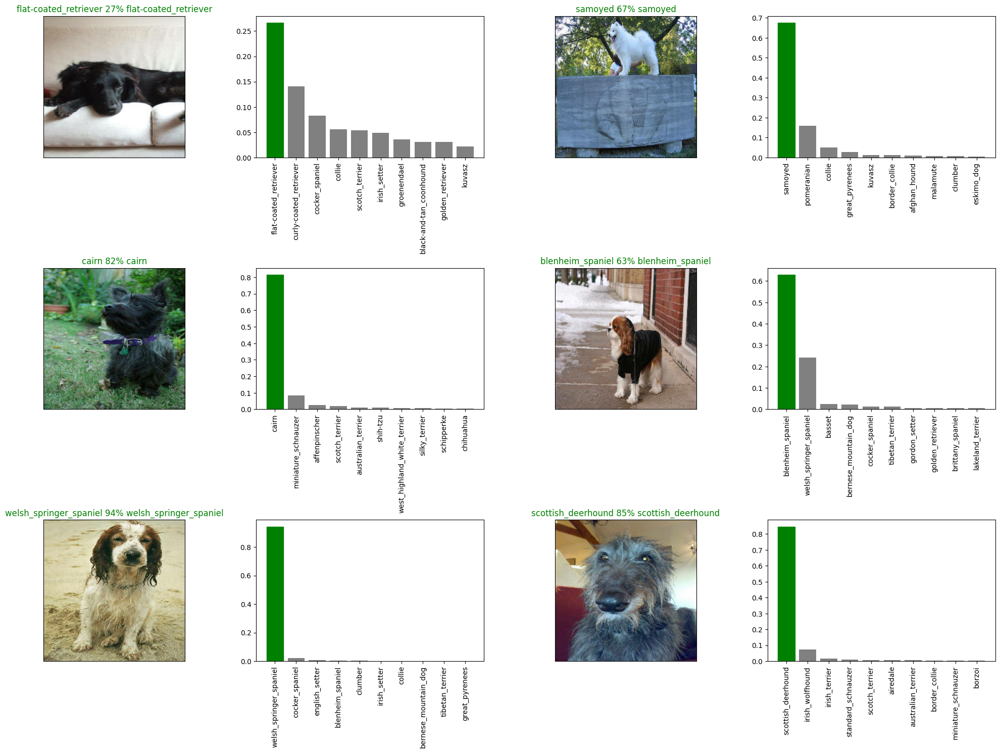

In [101]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


### Saving and reloading a trained model

In [102]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [103]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [104]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240421-18101713723023-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240421-18101713723023-1000-images-mobilenetv2-Adam.h5'

In [106]:
# load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20240421-18101713723023-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240421-18101713723023-1000-images-mobilenetv2-Adam.h5


In [107]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 154ms/step - loss: 1.2711 - accuracy: 0.6950


[1.2711201906204224, 0.6949999928474426]

In [108]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 150ms/step - loss: 1.2711 - accuracy: 0.6950


[1.2711201906204224, 0.6949999928474426]

## Training a big dog model 🐶 (on the full data)

In [109]:
len(X), len(y)

(10222, 10222)

In [110]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [111]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [112]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [113]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [114]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1054s 3s/step - loss: 1.3316 - accuracy: 0.6670
Epoch 2/100
320/320 [==============================] - 40s 125ms/step - loss: 0.4009 - accuracy: 0.8863
Epoch 3/100
320/320 [==============================] - 43s 135ms/step - loss: 0.2367 - accuracy: 0.9334
Epoch 4/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1530 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1047 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0764 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0592 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0466 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0377 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - 41s 129ms

In [115]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240421-18491713725384-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240421-18491713725384-full-image-set-mobilenetv2-Adam.h5'

In [118]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20240421-18491713725384-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240421-18491713725384-full-image-set-mobilenetv2-Adam.h5



Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

1. Get the test image filenames. ✅
2. Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
3. Make a predictions array by passing the test batches to the predict() method called on our model.

In [125]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]


['/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/deec3d206b0f5c927c86ed1782990961.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e312dda8d35118c40880c0f331c09509.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e4b76574d24800b91bdcfc886fb74f23.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/dfefaa03faeab447d6b48e7367255b43.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e5f2204119380ce1a17fd09435c5012a.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e3a55cc9c91da472abbced51d98d6ff6.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e12e6997c15c233c7b92209e08ff9d14.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identific

In [126]:
len(test_filenames)

10357

In [127]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Printing test data batches...


In [128]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [129]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 199s 605ms/step


In [130]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [131]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [132]:
test_predictions[:10]

array([[3.70272910e-12, 1.13972937e-11, 8.88471967e-13, ...,
        2.61216777e-11, 3.80985906e-13, 2.69098938e-10],
       [2.02790319e-11, 9.99977282e-15, 1.37198317e-11, ...,
        3.27959529e-13, 3.07785714e-10, 1.39695400e-09],
       [3.45835777e-10, 1.57795102e-15, 1.01985420e-10, ...,
        2.85163521e-13, 7.32603041e-12, 4.01667259e-14],
       ...,
       [4.18778079e-09, 1.34909408e-08, 4.14887324e-08, ...,
        2.98464541e-13, 9.81168185e-12, 6.04020584e-11],
       [9.37010136e-10, 7.01149971e-10, 4.82205442e-10, ...,
        7.95265076e-10, 4.54052795e-08, 5.17919776e-04],
       [4.52733380e-12, 1.69823281e-12, 2.03850181e-08, ...,
        7.63509807e-13, 3.46634665e-11, 8.18428035e-14]])

In [133]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [134]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [135]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [136]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,deec3d206b0f5c927c86ed1782990961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e379ba26a5e2e22e85975b839e0e401b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e312dda8d35118c40880c0f331c09509,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4b76574d24800b91bdcfc886fb74f23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dfefaa03faeab447d6b48e7367255b43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [137]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,deec3d206b0f5c927c86ed1782990961,3.702729e-12,1.139729e-11,8.884720e-13,7.771283e-09,2.303893e-08,3.253685e-08,5.865865e-11,8.467985e-13,1.793740e-12,...,3.040789e-13,2.307560e-12,1.683731e-10,1.726398e-09,4.756482e-13,3.394263e-10,2.948164e-11,2.612168e-11,3.809859e-13,2.690989e-10
1,e379ba26a5e2e22e85975b839e0e401b,2.027903e-11,9.999773e-15,1.371983e-11,3.492158e-12,4.426253e-13,2.109670e-09,4.377168e-11,2.300751e-09,1.695704e-16,...,5.391254e-11,9.999996e-01,9.916535e-13,1.888314e-12,7.788608e-14,1.280487e-13,6.302167e-09,3.279595e-13,3.077857e-10,1.396954e-09
2,e312dda8d35118c40880c0f331c09509,3.458358e-10,1.577951e-15,1.019854e-10,3.197665e-14,7.978462e-12,1.325326e-15,1.087579e-15,5.691496e-12,2.250201e-12,...,1.732045e-12,3.542497e-11,1.168370e-14,1.658833e-16,4.429225e-14,2.120249e-15,2.676123e-12,2.851635e-13,7.326030e-12,4.016673e-14
3,e4b76574d24800b91bdcfc886fb74f23,5.487523e-05,1.405904e-05,4.828886e-11,3.200265e-10,3.476000e-11,1.919201e-06,1.841484e-10,2.443006e-10,1.879676e-09,...,4.786483e-06,3.841103e-09,2.529165e-11,1.434033e-11,2.699259e-11,3.161842e-13,2.221607e-12,6.190344e-15,1.331522e-13,6.482394e-10
4,dfefaa03faeab447d6b48e7367255b43,1.848730e-10,1.036858e-12,4.094141e-12,5.246877e-11,2.388520e-12,2.870587e-10,3.634367e-13,2.017790e-12,1.662716e-10,...,2.053803e-09,9.223898e-12,5.264502e-10,6.083588e-09,5.347105e-12,6.980205e-07,1.244989e-09,1.883196e-12,1.191831e-13,5.018939e-07


In [138]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [155]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [156]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/my-dog-photos/IMG_0135.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/IMG_8759.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/IMG_8448.jpg']

In [157]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Printing test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [158]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 910ms/step


In [159]:
custom_preds.shape

(3, 120)

In [160]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['miniature_pinscher', 'norwich_terrier', 'pomeranian']

In [161]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

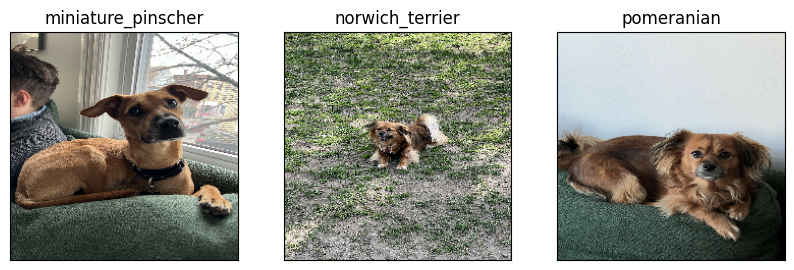

In [162]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [167]:
def plot_pred_dist(custom_prediction_probabilities, n=1): # get proability distribution for custom images
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob = custom_prediction_probabilities[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


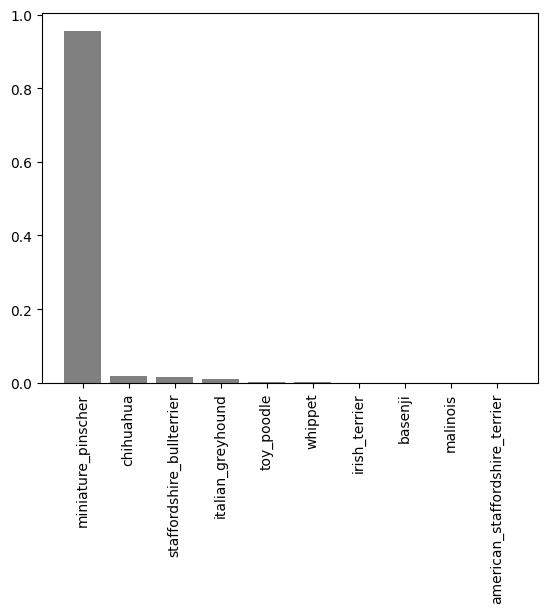

In [177]:
plot_pred_dist(custom_prediction_probabilities=custom_preds,
               n=0)

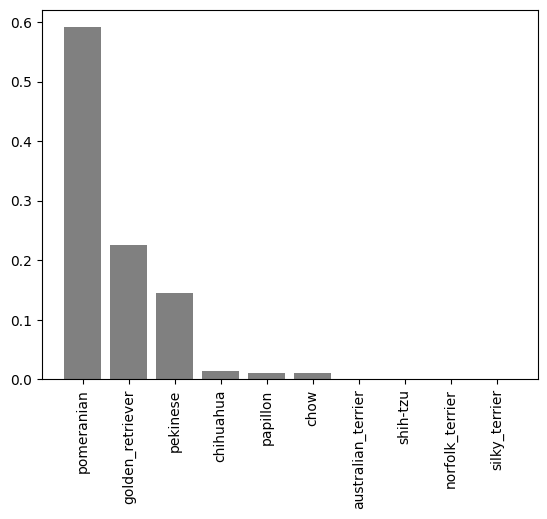

In [180]:
plot_pred_dist(custom_prediction_probabilities=custom_preds,
               n=2)